1 imports


In [1]:
# --- Geospatial and Mapping ---
import geopandas as gpd
import folium
from folium import FeatureGroup, LayerControl
from folium.raster_layers import ImageOverlay
from folium.elements import Element

# --- Raster and Image Processing ---
import rasterio
from rasterio.features import rasterize
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling, transform_bounds
from rasterio.transform import array_bounds
from affine import Affine

# --- Data and Math ---
import numpy as np
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import hdbscan  # type: ignore
import joblib

# --- Visualization ---
import matplotlib.pyplot as plt

# --- Colormaps and Templates ---
from branca.colormap import LinearColormap
from branca.element import Template, MacroElement

# --- Image Handling ---
from PIL import Image
from io import BytesIO
import base64

# --- Utilities ---
import os
import glob

# --- OpenStreetMap and Geometry ---
import osmnx as ox
from shapely.geometry import Point
from skimage.segmentation import find_boundaries
from skimage.transform import resize
from scipy.ndimage import generic_filter


2 file check (useless )

In [2]:
# --- Path Configuration ---
DATA_DIR = os.path.join("..", "data")
REPROJECTED_DIR = os.path.join(DATA_DIR, "reprojected")
WEB_MAPS_DIR = os.path.join("..", "web", "maps")

os.makedirs(WEB_MAPS_DIR, exist_ok=True)
os.makedirs(REPROJECTED_DIR, exist_ok=True)

output_map_path = os.path.join(WEB_MAPS_DIR, "algiers_map.html")

# --- File Discovery ---
tiff_paths = glob.glob(os.path.join(DATA_DIR, "*.tif"))
geojson_paths = glob.glob(os.path.join(DATA_DIR, "*.geojson"))

# --- Required Files ---
pop_path = os.path.join(DATA_DIR, "pop2018_100m.tif")
build_path = os.path.join(DATA_DIR, "build2018_10m.tif")

if not (os.path.exists(pop_path) and os.path.exists(build_path)):
    raise FileNotFoundError("Population or building data file is missing.")

# --- Parameters ---
n_clusters = 2      # For clustering analysis
upscale_factor = 8      # For resolution adjustment
scale = 0.25  # réduction à 50 %


3 functions


In [3]:
def align_raster(src_data, src_transform, src_crs, dst_shape, dst_transform, dst_crs):
    """
    Reproject and align raster data to a target grid.
    """
    aligned = np.empty(dst_shape, dtype=np.float32)
    reproject(
        source=src_data,
        destination=aligned,
        src_transform=src_transform,
        src_crs=src_crs,
        dst_transform=dst_transform,
        dst_crs=dst_crs,
        resampling=Resampling.bilinear,
        src_nodata=np.nan,
        dst_nodata=np.nan,
    )
    return aligned


def apply_colormap(data, cmap, upscale_factor=1, background_label=None):
    """
    Convert raster data to RGB using a colormap.
    
    Handles both continuous data and discrete labels:
    - Continuous: NaN areas become white with black borders
    - Discrete: Specify background_label for transparency
    """
    # Upscale if needed
    if upscale_factor > 1:
        data = np.repeat(np.repeat(data, upscale_factor, axis=0), upscale_factor, axis=1)

    # For discrete labels
    if background_label is not None:
        rgb = np.zeros((*data.shape, 3), dtype=np.uint8)
        alpha = np.zeros(data.shape, dtype=np.uint8)
        
        for label in np.unique(data):
            if label == background_label:
                continue
            color = np.array(cmap(label % 20)[:3]) * 255  # Cycle colormap
            rgb[data == label] = color.astype(np.uint8)
            alpha[data == label] = 255
            
        rgba = np.dstack((rgb, alpha))
    
    # For continuous data
    else:
        mask = np.isnan(data)
        valid_data = data[~mask]
        
        # Normalize only valid data
        normalized = (data - np.nanmin(valid_data)) / (np.nanmax(valid_data) - np.nanmin(valid_data))
        rgba = (cmap(normalized)[..., :3] * 255).astype(np.uint8)
        rgba = np.dstack((rgba, np.full(data.shape, 255, dtype=np.uint8)))  # Add alpha channel
        
        # Add borders between valid/invalid areas
        border = np.logical_xor(mask, np.roll(mask, 1, axis=0)) | \
                 np.logical_xor(mask, np.roll(mask, 1, axis=1))
        rgba[border] = [0, 0, 0, 255]  # Black borders
        rgba[mask] = [0, 0, 0, 0]  # White background

    return rgba
#new
def rasterize_geojson(path, ref_crs, ref_transform, ref_shape, buffer_distance=0.0005):
    try:
        gdf = gpd.read_file(path)
    except Exception:
        return np.zeros(ref_shape, dtype=np.float32)
    if gdf.empty:
        return np.zeros(ref_shape, dtype=np.float32)
    if gdf.crs != ref_crs:
        gdf = gdf.to_crs(ref_crs)
    gdf['geometry'] = gdf.geometry.buffer(buffer_distance)
    geometries = [(geom, 1) for geom in gdf.geometry if geom is not None]
    if not geometries:
        return np.zeros(ref_shape, dtype=np.float32)
    raster = rasterize(
        geometries,
        out_shape=ref_shape,
        transform=ref_transform,
        fill=0,
        all_touched=True,
        dtype=np.float32
    )
    return raster

def create_feature_matrix(layers, mask):
    # Empilement des couches avec remplissage des NaN par 0 temporairement
    stack = np.stack([np.nan_to_num(layer, nan=np.nan) for layer in layers], axis=-1)

    # Masque 2D => masque 1D sur tous les pixels valides
    X = stack[mask]  

    # Remplacement des NaNs par la moyenne de chaque colonne
    nan_mask = np.isnan(X)
    if np.any(nan_mask):
        col_means = np.nanmean(X, axis=0)
        # Remplacer les NaN dans chaque colonne par la moyenne correspondante
        inds = np.where(nan_mask)
        X[inds] = np.take(col_means, inds[1])

    return X

def create_segmentation(labels, mask, shape):
    seg = np.full(shape, -1, dtype=int)
    seg[mask] = labels
    return seg




def downsample_raster(raster, scale=0.5):
    
    #Redimensionne un raster 2D en appliquant un facteur de réduction.
   
    height, width = raster.shape
    new_height = int(height * scale)
    new_width = int(width * scale)
    
    raster_ds = resize(
        raster,
        (new_height, new_width),
        anti_aliasing=True,
        preserve_range=True
    )
    
    return raster_ds

def raster_layer(rgb_image, bounds, crs, layer_name):
    
    #Create a folium raster overlay layer from an RGBA image.
    
    bounds_wgs84 = transform_bounds(crs, "EPSG:4326", *bounds)
    img = Image.fromarray(rgb_image)
    buffer = BytesIO()
    img.save(buffer, format="PNG", quality=95)
    img_base64 = base64.b64encode(buffer.getvalue()).decode()
    layer = FeatureGroup(name=layer_name)
    ImageOverlay(
        image=f"data:image/png;base64,{img_base64}",
        bounds=[[bounds_wgs84[1], bounds_wgs84[0]], [bounds_wgs84[3], bounds_wgs84[2]]],
        opacity=0.9,
    ).add_to(layer)
    return layer

def analyze_all_clusters(segmentation, X, mask, feature_names, descriptions):
    profiles = []
    labels = np.unique(segmentation)
    for label in labels:
        if label == -1:
            continue
        mask_label = (segmentation == label) & mask
        if np.sum(mask_label) == 0:
            continue
        X_label = X[mask_label[mask]]
        mean_vals = np.mean(X_label, axis=0)
        desc = descriptions.get(f"Cluster {label}", f"Cluster {label}")
        features = [
            ("Population", mean_vals[feature_names.index("Population")]),
            ("Buildings", mean_vals[feature_names.index("Buildings")])
        ]
        profiles.append({'cluster': desc, 'features': features})
    return profiles


def create_combined_legend_fixed(cluster_profiles, colormap):
    legend_html = '''
    <div style="position: fixed; bottom: 40px; left: 40px; z-index:9999;
                background-color: white; padding: 15px; border:2px solid grey; border-radius: 5px;
                max-height: 600px; overflow-y: auto;">
        <strong style="font-size:14px;">CLUSTER LEGEND</strong><br>
    '''
    for profile in cluster_profiles:
        # Use the numeric cluster label directly
        cluster_label = profile.get('label', 0)  # fallback to 0 if not present
        color = np.array(colormap(cluster_label % 20)[:3]) * 255
        color_hex = '#%02x%02x%02x' % tuple(color.astype(int))
        legend_html += f'''
        <div style="margin:10px 0; padding:5px; border-bottom:1px solid #eee;">
            <div style="display:flex; align-items:center;">
                <div style="width:20px; height:20px; background:{color_hex};
                            border:1px solid #000; margin-right:10px;"></div>
                <strong>{profile['cluster']}</strong>
            </div>
            <div style="margin-left:30px; font-size:12px;">
        '''
        for feat_name, feat_val in profile['features']:
            legend_html += f'''
                <div style="margin:3px 0;">
                    • {feat_name}: <em>{feat_val:.2f}</em>
                </div>
            '''
        legend_html += '''
            </div>
        </div>
        '''
    legend_html += "</div>"
    return legend_html


4 reprojection and loading data

In [4]:
dst_crs = "EPSG:4326"  # Target CRS WGS84


def reproject_raster(input_path):
    with rasterio.open(input_path) as src:
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )
        profile = src.profile.copy()
        profile.update({
            "crs": dst_crs,
            "transform": transform,
            "width": width,
            "height": height,
            "dtype": "float32",
            "nodata": np.nan
        })
        name, ext = os.path.splitext(os.path.basename(input_path))
        output_path = os.path.join(REPROJECTED_DIR, f"{name}_wgs84{ext}")
        with rasterio.open(output_path, "w", **profile) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.bilinear,
            )
    return output_path

print("\n=== Reprojecting data ===")
all_reprojected = [reproject_raster(path) for path in tiff_paths]
pop_reprojected = next(p for p in all_reprojected if "pop" in p)
build_reprojected = next(p for p in all_reprojected if "build" in p)

with rasterio.open(all_reprojected[0]) as src:
    ref_transform = src.transform
    ref_crs = src.crs
    ref_shape = src.shape
    bounds = src.bounds

print("Reprojection completed.")

def load_raster(file_path):
    with rasterio.open(file_path) as src:
        data = src.read(1).astype(np.float32)
        mask = (data < 0) | (data == src.nodata)
        data[mask] = np.nan
        return data, src.bounds, src.transform, src.crs, src.shape


all_data = [dict(zip(['data', 'bounds', 'transform', 'crs'], load_raster(path))) for path in all_reprojected]

ref_data = all_data[0]
ref_shape = ref_data['data'].shape
ref_transform = ref_data['transform']
ref_crs = ref_data['crs']

aligned_rasters = [ref_data['data']]
for dataset in all_data[1:]:
    aligned = align_raster(
        src_data=dataset['data'],
        src_transform=dataset['transform'],
        src_crs=dataset['crs'],
        dst_shape=ref_shape,
        dst_transform=ref_transform,
        dst_crs=ref_crs
    )
    aligned_rasters.append(aligned)

build_data , pop_data = aligned_rasters[0], aligned_rasters[1]

combined_bounds = [
    [ref_data['bounds'].bottom, ref_data['bounds'].left],
    [ref_data['bounds'].top, ref_data['bounds'].right]
]

print("Reference raster bounds:", ref_data['bounds'])
print("Combined bounds for mapping:", combined_bounds)
print(all_reprojected)



=== Reprojecting data ===
Reprojection completed.
Reference raster bounds: BoundingBox(left=2.802126965198183, bottom=36.58205920400661, right=3.3873481100586162, top=36.818787594643446)
Combined bounds for mapping: [[36.58205920400661, 2.802126965198183], [36.818787594643446, 3.3873481100586162]]
['..\\data\\reprojected\\build2018_10m_wgs84.tif', '..\\data\\reprojected\\pop2018_100m_wgs84.tif']


5 map creation 

In [5]:
# Center map on the area of interest
center_lat = (combined_bounds[0][0] + combined_bounds[1][0]) / 2
center_lon = (combined_bounds[0][1] + combined_bounds[1][1]) / 2

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    max_bounds=combined_bounds,
)
m.fit_bounds(combined_bounds)
m.get_root().width = "100%"
m.get_root().height = "700px"

# --- OSM Infrastructure Layers ---
infra_tags = {
    "Hospitals": {"tags": {"amenity": "hospital"}, "category": "healthcare"},
    "Clinics": {"tags": {"amenity": "clinic"}, "category": "healthcare"},
    "Schools": {"tags": {"amenity": "school"}, "category": "education"},
    "Kindergartens": {"tags": {"amenity": "kindergarten"}, "category": "education"},
    "Libraries": {"tags": {"amenity": "library"}, "category": "education"},
    "Universities": {"tags": {"amenity": "university"}, "category": "education"},
    "Bus Stops": {"tags": {"highway": "bus_stop"}, "category": "transport"},
    "Train Stations": {"tags": {"railway": "station"}, "category": "transport"},
    "Metro Stations": {"tags": {"railway": "subway_entrance"}, "category": "transport"},
    "Tramway Stops": {"tags": {"railway": "tram_stop"}, "category": "transport"},
    "Parking": {"tags": {"amenity": "parking"}, "category": "transport"},
    "Taxi": {"tags": {"amenity": "taxi"}, "category": "transport"},
    "Markets": {"tags": {"amenity": "marketplace"}, "category": "commercial"},
    "Shopping Malls": {"tags": {"shop": "mall"}, "category": "commercial"},
    "Police Stations": {"tags": {"amenity": "police"}, "category": "government"},
    "Post Offices": {"tags": {"amenity": "post_office"}, "category": "government"},
}

infra_config = {
    'healthcare': {'color': 'red', 'icon': 'hospital'},
    'education': {'color': 'blue', 'icon': 'graduation-cap'},
    'transport': {'color': 'green', 'icon': 'bus'},
    'commercial': {'color': 'black', 'icon': 'shopping-cart'},
    'government': {'color': 'purple', 'icon': 'building'}
}

def add_infrastructure_layer(gdf, name, category):
    layer = folium.FeatureGroup(name=name, show=False)
    for _, row in gdf.iterrows():
        geom = row.geometry
        if geom.geom_type != 'Point':
            geom = geom.centroid
        folium.Marker(
            location=[geom.y, geom.x],
            popup=row.get('name', name),
            icon=folium.Icon(
                color=infra_config[category]['color'],
                icon=infra_config[category]['icon'],
                prefix='fa'
            )
        ).add_to(layer)
    layer.add_to(m)

for name, cfg in infra_tags.items():
    gdf = ox.features_from_place("Algiers", tags=cfg["tags"])
    add_infrastructure_layer(gdf, name, cfg["category"])


6 clustring and visualization 

In [6]:
# --- Colormaps ---
import re


pop_cmap = plt.colormaps['hot']
build_cmap = plt.colormaps['viridis']

pop_rgb = apply_colormap(pop_data, pop_cmap)
build_rgb = apply_colormap(build_data, build_cmap)

# Chargement du raster de référence
ref_raster, _, ref_transform, ref_crs, ref_shape = load_raster(tiff_paths[0])
ref_shape_orig = ref_raster.shape  # ex: (1346, 2531)

# Calcul de la nouvelle taille
ref_shape_ds = (int(ref_shape_orig[0] * scale), int(ref_shape_orig[1] * scale))

# Downsample le raster de référence
ref_raster = downsample_raster(ref_raster, scale=scale)
ref_shape = ref_raster.shape  # forme réduite
ref_transform = ref_transform * Affine.scale(1/scale, 1/scale)

aligned_rasters = [ref_raster]

# Aligner les autres rasters à la forme originale, puis downsampler
for path in tiff_paths[1:]:
    raster, _, transform, crs, _ = load_raster(path)
    aligned = align_raster(raster, transform, crs, ref_shape_orig, ref_transform * Affine.scale(scale, scale), ref_crs)
    aligned = downsample_raster(aligned, scale=scale)
    aligned_rasters.append(aligned)


# 1. Rasteriser les GeoJSON avec la même forme réduite
geojson_rasters = []
for path in geojson_paths:
    raster = rasterize_geojson(path, ref_crs, ref_transform, ref_shape)
    if np.any(raster > 0):  # On ne garde que les GeoJSON non vides
        geojson_rasters.append(raster * 1000)

# 2. Création du masque : uniquement les pixels valides (pas NaN) dans tous les rasters
mask = ~np.isnan(ref_raster)
for raster in aligned_rasters[1:]:
    mask = mask & ~np.isnan(raster)

# 3. Fusionner toutes les couches (rasters alignés + GeoJSON rasterisés)
all_layers = aligned_rasters + geojson_rasters

# 4. Filtrer les couches vides et créer la matrice de features
filtered_layers = [layer for layer in all_layers if np.any(~np.isnan(layer[mask]))]

# 5. Création de la matrice de features X (2D : pixels x variables)
X = create_feature_matrix(filtered_layers, mask)

# 1. Normalize features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# 2. PCA for dimensionality reduction
pca = PCA(n_components=10)
X_scaled_pca = pca.fit_transform(X_scaled)

# 3. HDBSCAN clustering with model caching
hdbscan_model_path = os.path.join(WEB_MAPS_DIR, "hdbscan_model.joblib")
if os.path.exists(hdbscan_model_path):
    print("Loading existing HDBSCAN model...")
    clusterer = joblib.load(hdbscan_model_path)
    db_labels = clusterer.labels_
else:
    print("Training new HDBSCAN model...")
    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=50,
        min_samples=20,
        cluster_selection_epsilon=0.2,
        prediction_data=True
    )
    db_labels = clusterer.fit_predict(X_scaled_pca)
    joblib.dump(clusterer, hdbscan_model_path)
    print(f"HDBSCAN model saved to {hdbscan_model_path}")

# 4. Mask for dense (non-noise) points
dense_mask = db_labels != -1
if np.sum(dense_mask) == 0:
    raise ValueError("No clusters found! Adjust HDBSCAN parameters or check input data")
X_dense = X_scaled_pca[dense_mask]

# 5. KMeans on dense points (main segmentation)
mbk = MiniBatchKMeans(
    n_clusters=n_clusters,
    batch_size=10000,
    random_state=42,
    n_init='auto'
)
mbk_labels_core = mbk.fit_predict(X_dense)

# 6. Rebuild full label grid
full_kmeans_labels = np.full_like(db_labels, fill_value=-1)
full_kmeans_labels[dense_mask] = mbk_labels_core


# 7. Create segmentation image
segmentation = create_segmentation(full_kmeans_labels, mask, ref_shape)

# --- Hierarchical Clustering: Segment the Light Blue Zone Further ---
# Identify the label for the light blue cluster (urban zone)
# (Check which label is light blue by inspecting unique values or visualizing)
light_blue_label = 1  # Usually 1 if background is 0, confirm by checking your map
light_blue_mask = (segmentation == light_blue_label)

# Extract features for these pixels (use the original X, not PCA)
X_light_blue = X[light_blue_mask[mask]]

# Cluster within the urban zone
n_subclusters = 2  # Adjust as needed for sub-zones
kmeans_light_blue = MiniBatchKMeans(n_clusters=n_subclusters, random_state=42)
light_blue_sub_labels = kmeans_light_blue.fit_predict(X_light_blue)

# Insert subcluster labels back into segmentation
segmentation_refined = segmentation.copy()
max_label = segmentation.max()
segmentation_refined[light_blue_mask] = light_blue_sub_labels + max_label + 1

# Smooth the boundaries (mode filter)
def mode_filter(segmentation, size):
    def mode_func(x):
        vals, counts = np.unique(x, return_counts=True)
        return vals[np.argmax(counts)]
    return generic_filter(segmentation, mode_func, size=size)

smoothed_segmentation = mode_filter(segmentation_refined, size=20)

# --- Hierarchical Clustering: Segment the Orange Cluster Further ---
orange_label = 2  # Replace with the actual label for orange if different

# Mask for orange cluster in the current segmentation
orange_mask = (smoothed_segmentation == orange_label)

# Only consider valid pixels (where mask is True)
valid_orange_mask = orange_mask & mask  # 2D mask

# Extract features for these pixels (use the original X, not PCA)
X_orange = X[valid_orange_mask[mask]]  # This selects only the valid orange pixels

# Cluster within the orange zone
kmeans_orange = MiniBatchKMeans(n_clusters=2, random_state=42)
orange_sub_labels = kmeans_orange.fit_predict(X_orange)

# Insert subcluster labels back into segmentation
# Flatten for assignment, then reshape back
segmentation_orange_refined = smoothed_segmentation.copy().ravel()
idx_valid_orange = np.where(valid_orange_mask.ravel())[0]
max_label = smoothed_segmentation.max()
segmentation_orange_refined[idx_valid_orange] = orange_sub_labels + max_label + 1
segmentation_orange_refined = segmentation_orange_refined.reshape(smoothed_segmentation.shape)
# Smooth the boundaries (mode filter)
smoothed_segmentation_final = mode_filter(segmentation_orange_refined, size=20)



# --- Visualization ---
cluster_cmap = plt.cm.tab20
cluster_rgb = apply_colormap(
    smoothed_segmentation_final,  # use the final, smoothed segmentation!
    cluster_cmap,
    upscale_factor=4,
    background_label=-1
)

# Specify the clusters you want to outline (adjust as needed)
clusters_to_outline = [label for label in np.unique(smoothed_segmentation_final) if label != -1]

# Find boundaries only for these clusters
mask_outline = np.isin(smoothed_segmentation_final, clusters_to_outline)
boundaries = find_boundaries(smoothed_segmentation_final, mode='outer') & mask_outline

# Upscale boundaries to match cluster_rgb size (if you use upscale_factor)
if cluster_rgb.shape[:2] != boundaries.shape:
    boundaries = resize(boundaries.astype(float), cluster_rgb.shape[:2], order=0, preserve_range=True).astype(bool)

# Create an RGBA image for the outline: black color with full opacity where boundaries are
outline = np.zeros_like(cluster_rgb)
outline[boundaries] = [0, 0, 0, 255]  # Black with full opacity

# Overlay the outline on top of the cluster_rgb image (alpha compositing)
alpha_outline = outline[..., 3:4] / 255.0
alpha_cluster = cluster_rgb[..., 3:4] / 255.0
alpha_composite = alpha_outline + alpha_cluster * (1 - alpha_outline)
composite_rgb = (outline[..., :3] * alpha_outline + cluster_rgb[..., :3] * alpha_cluster * (1 - alpha_outline)) / np.clip(alpha_composite, 1e-6, 1)
composite_rgb = np.clip(composite_rgb, 0, 255).astype(np.uint8)
composite_alpha = (alpha_composite * 255).astype(np.uint8)
cluster_rgb_with_outline = np.dstack((composite_rgb, composite_alpha))

ref_bounds = array_bounds(ref_shape[0], ref_shape[1], ref_transform)
cluster_layer = raster_layer(cluster_rgb_with_outline, ref_bounds, ref_crs, "Urban Clusters")
cluster_layer.add_to(m)

feature_names = ["Population", "Buildings"] + [os.path.splitext(os.path.basename(p))[0] for p in geojson_paths]
present_labels = set(np.unique(smoothed_segmentation_final))
descriptions = {
    "Cluster 0": "Very low / Non-urban areas",
    "Cluster 3": "High building and population density",
    "Cluster 4": "Moderate building and population density",
    "Cluster 5": "low building and population density",
}

# Analyze clusters as before
combined_profiles = analyze_all_clusters(
    smoothed_segmentation_final, X, mask, feature_names, descriptions
)

# Add 'label' field to each profile for color mapping
reverse_desc = {v: int(k.split()[1]) for k, v in descriptions.items()}  # e.g., {"Non-urban areas": 0, ...}
for profile in combined_profiles:
    match = re.search(r'(\d+)', profile['cluster'])
    if match:
        profile['label'] = int(match.group(1))
    else:
        profile['label'] = reverse_desc.get(profile['cluster'], 0)


# Filter for desired clusters
desired_labels = [0, 3, 4, 5]
desired_names = [f"Cluster {label}" for label in desired_labels]
desired_names += [descriptions.get(f"Cluster {label}", f"Cluster {label}") for label in desired_labels]

combined_profiles = [
    profile for profile in combined_profiles
    if profile['cluster'] in desired_names
]

# Create the fixed legend with only the desired clusters
combined_legend_fixed = create_combined_legend_fixed(combined_profiles, cluster_cmap)
m.get_root().html.add_child(Element(combined_legend_fixed))


Loading existing HDBSCAN model...


7 layers and legend 

In [7]:
# --- Colormap Legends ---


pop_min, pop_max = np.nanmin(pop_data), np.nanmax(pop_data)
build_min, build_max = np.nanmin(build_data), np.nanmax(build_data)

def create_colormap(cmap_name, vmin, vmax, caption):
    cmap = plt.get_cmap(cmap_name)
    return LinearColormap(
        colors=[cmap(x) for x in np.linspace(0, 1, 10)],
        vmin=vmin,
        vmax=vmax,
        caption=caption,
    )

pop_colormap = create_colormap('hot', pop_min, pop_max, "Population Density (people/km²)")
build_colormap = create_colormap('viridis', build_min, build_max, "Building Density (buildings/km²)")

pop_colormap.add_to(m)
build_colormap.add_to(m)

# Custom HTML legend and CSS
with open("../web/html/legend.html") as f:
    legend_html = f.read()
m.get_root().html.add_child(folium.Element(legend_html))

with open("../web/css/map_custom.css") as f:
    legend_css = f"<style>{f.read()}</style>"
m.get_root().html.add_child(folium.Element(legend_css))

# --- Raster Overlays ---
ImageOverlay(
    pop_rgb, 
    bounds=[[ref_data['bounds'].bottom, ref_data['bounds'].left],
            [ref_data['bounds'].top, ref_data['bounds'].right]],
    name="Population Density",
    opacity=0.7,
    interactive=True,
    zindex=1
).add_to(m)

ImageOverlay(
    build_rgb,
    bounds=[[ref_data['bounds'].bottom, ref_data['bounds'].left],
            [ref_data['bounds'].top, ref_data['bounds'].right]],
    name="Building Density",
    opacity=0.7,
    interactive=True,
    zindex=1
).add_to(m)



Map saved to ..\web\maps\algiers_map.html



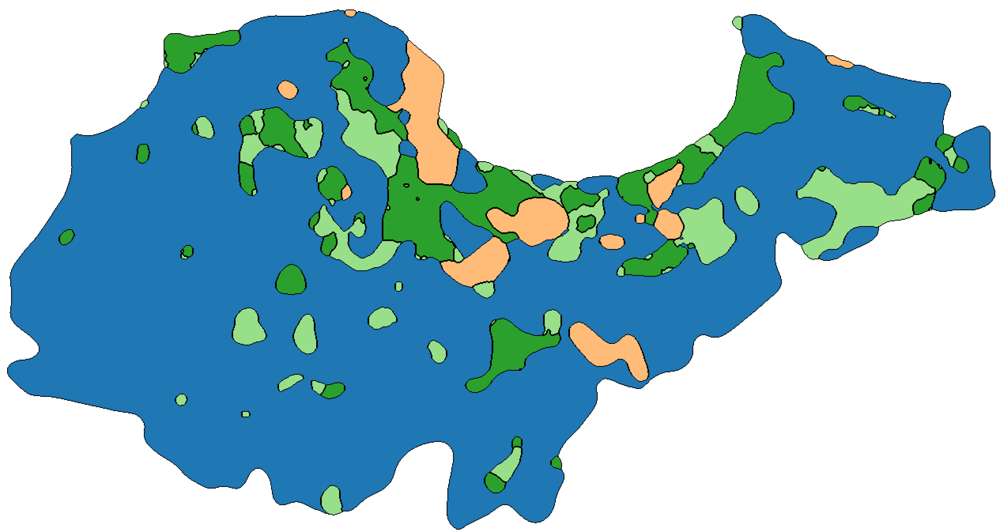
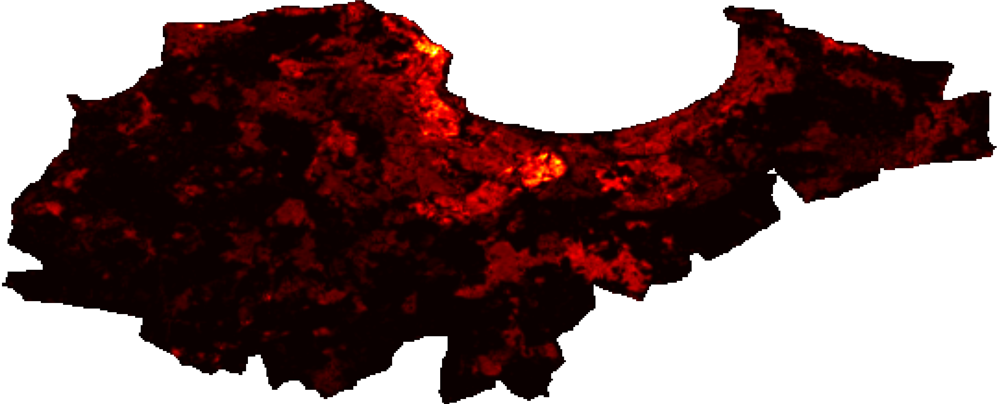
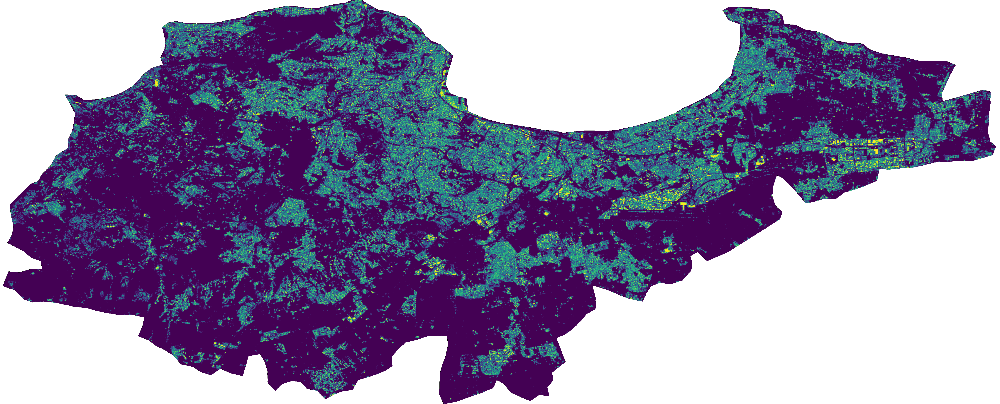

In [8]:
LayerControl(position="topright", collapsed=False).add_to(m)
#m.save(output_map_path)
print(f"Map saved to {output_map_path}")
m

8 la fin